## This notebook leverages the "best-artworks-of-all-time" dataset to perform fine-tuning on the VGG19 model. Subsequently, the fine-tuned VGG19 model is employed as a feature extractor within a style transfer algorithm. Pytorch is used as a deep learning framework



In [36]:
import numpy as np 
import pandas as pd 
import os
import random
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from collections import namedtuple
from torchvision import transforms, models, datasets
from PIL import Image
from tqdm import tqdm
from collections import OrderedDict
import torchvision
!pip install torchsummary
root_dir = '/kaggle/input/best-artworks-of-all-time/images/images/'
# Load the artists dataset
artists = pd.read_csv('/kaggle/input/best-artworks-of-all-time/artists.csv')
monalisa = '/kaggle/input/monalisa/monsalisa.jpg'

### Defining a custom dataset class named ArtDatase

In [6]:
# Check if a GPU is available for accelerated computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Define a custom dataset class for artwork images
class ArtDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        # Specify the root directory and transformation functions
        self.root_dir = root_dir
        self.transform = transform
        
        # Extract class labels and image paths from the provided dataframe
        self.class_labels = dataframe['class_label']
        self.image_paths = dataframe['images_path']

    def __len__(self):
        # Return the total number of images in the dataset
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Retrieve the image path and corresponding class label for a given index
        img_path = self.image_paths[idx]
        class_label = self.class_labels[idx]

        # Open the image, convert it to RGB, and apply transformations if specified
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        # Return the preprocessed image and its associated class label
        return image, class_label


Using device: cuda


# Data Preprocessing

### Plotting the Histogram of the given dataset

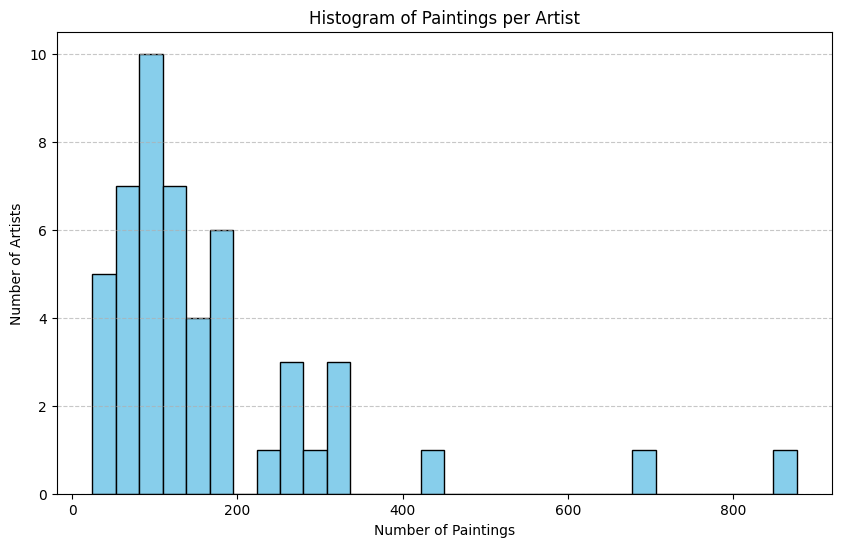

In [7]:
# Plot histogram for the 'paintings' column
plt.figure(figsize=(10, 6))
plt.hist(artists['paintings'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Paintings per Artist')
plt.xlabel('Number of Paintings')
plt.ylabel('Number of Artists')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### The next cell works as follows
* The artists are sorted based on the number of paintings they have, in descending order.
* A new dataframe, artists_top, is created, including only artists with more than 200 paintings 
* Class weights for each artist are calculated, with the weight determined as the total paintings divided by the product of the number of artists and their paintings.
* Class weights are normalized to ensure they collectively sum up to 1.
* The resulting dataframe, artists_top, is displayed, presenting artist names, the number of paintings, and their corresponding class weights.

In [12]:
print("Dataset Shape:", artists.shape)  # Check the shape of the dataset

# Sort artists by the number of paintings in descending order
artists = artists.sort_values(by=['paintings'], ascending=False)

# Create a dataframe with artists having more than 200 paintings
artists_top = artists[artists['paintings'] >= 200].reset_index()
artists_top = artists_top[['name', 'paintings']]

# Calculate class weights for each artist based on the number of paintings
# The class weight is computed as the total paintings divided by the product of the number of artists and their paintings
artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)

# Normalize class weights to ensure they sum up to 1
total_weights = artists_top['class_weight'].sum()
artists_top['class_weight'] = artists_top['class_weight'] / total_weights


# Set class weights - assign higher weights to underrepresented classes
class_weights = artists_top['class_weight'].to_dict()
num_classes = len(class_weights)
# Display the resulting dataframe with artist names, number of paintings, and class weights
artists_top

Dataset Shape: (50, 8)


,name,paintings,class_weight
0,Vincent van Gogh,877,0.034239
1,Edgar Degas,702,0.042774
2,Pablo Picasso,439,0.068399
3,Pierre-Auguste Renoir,336,0.089367
4,Albrecht Dürer,328,0.091547
5,Paul Gauguin,311,0.096551
6,Francisco Goya,291,0.103187
7,Rembrandt,262,0.114608
8,Alfred Sisley,259,0.115936
9,Titian,255,0.117754


### Configuring some mismatching in the name conventions and checking if all the folders exists
> There appears to be an issue with recognizing 'Albrecht_Dürer' (reason unknown, may require investigation)

> To address this, I'm updating the string to be used as a directory name in the dataframe

In [13]:
updated_name = "Albrecht_Dürer".replace("_", " ")
artists_top.iloc[4, 0] = updated_name
artists_top_name = artists_top['name'].str.replace(' ', '_').values
for name in artists_top_name:
    directory_path = os.path.join(root_dir, name)
    if os.path.exists(directory_path):
        print(f"Found: {directory_path}")
    else:
        print(f"Did not find: {directory_path}")

Found: /kaggle/input/best-artworks-of-all-time/images/images/Vincent_van_Gogh
Found: /kaggle/input/best-artworks-of-all-time/images/images/Edgar_Degas
Found: /kaggle/input/best-artworks-of-all-time/images/images/Pablo_Picasso
Found: /kaggle/input/best-artworks-of-all-time/images/images/Pierre-Auguste_Renoir
Found: /kaggle/input/best-artworks-of-all-time/images/images/Albrecht_Dürer
Found: /kaggle/input/best-artworks-of-all-time/images/images/Paul_Gauguin
Found: /kaggle/input/best-artworks-of-all-time/images/images/Francisco_Goya
Found: /kaggle/input/best-artworks-of-all-time/images/images/Rembrandt
Found: /kaggle/input/best-artworks-of-all-time/images/images/Alfred_Sisley
Found: /kaggle/input/best-artworks-of-all-time/images/images/Titian
Found: /kaggle/input/best-artworks-of-all-time/images/images/Marc_Chagall


#### Visualizing Paintings
This code snippet generates a visualization by randomly selecting artists from the dataset and displaying a painting from each selected artist.

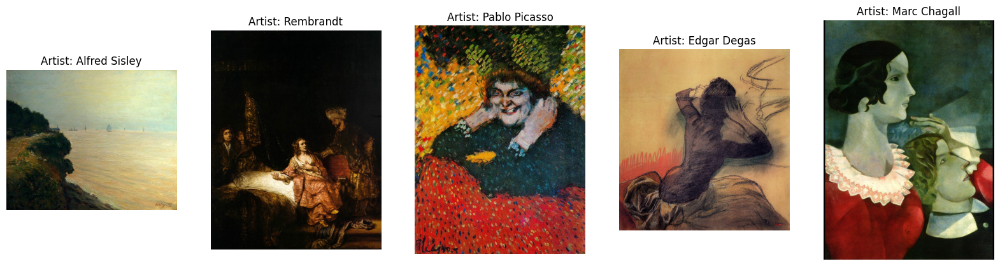

In [14]:
# Display a few random paintings from the dataset
num_paintings_to_display = 5  # Number of paintings to show in the visualization
fig, axes = plt.subplots(1, num_paintings_to_display, figsize=(20, 10))

# Iterate to select random artists and paintings
for i in range(num_paintings_to_display):
    # Randomly choose an artist from the top artists list
    random_artist = random.choice(artists_top_name)
    
    # Randomly select a painting from the chosen artist's directory
    random_image = random.choice(os.listdir(os.path.join(root_dir, random_artist)))
    random_image_file = os.path.join(root_dir, random_artist, random_image)
    
    # Load and display the image
    image = plt.imread(random_image_file)
    axes[i].imshow(image)
    axes[i].set_title("Artist: " + random_artist.replace('_', ' '))
    axes[i].axis('off')

plt.show()

#### This function, get_dataset, is designed to create training and validation datasets for a classification task based on a list of artist names and the root directory of the dataset. 

In [17]:
def get_dataset(artists_names, dataset_root):
    train_images = []
    train_labels = []
    val_images = []
    val_labels = []

    train_ratio = 0.8

    for class_label, class_name in enumerate(artists_names):
        class_path = os.path.join(dataset_root, class_name)
        
        if os.path.isdir(class_path):
            # Get the list of image paths
            image_paths = [os.path.join(class_path, img) for img in os.listdir(class_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
            
            # Shuffle the image paths and split into training and validation sets
            random.shuffle(image_paths)
            num_train_images = int(len(image_paths) * train_ratio)
            train_images.extend(image_paths[:num_train_images])
            val_images.extend(image_paths[num_train_images:])
            
            # Assign class labels for training and validation
            train_labels.extend([class_label] * num_train_images)
            val_labels.extend([class_label] * (len(image_paths) - num_train_images))

    train_df = pd.DataFrame({'images_path': train_images, 'class_label': train_labels})
    val_df = pd.DataFrame({'images_path': val_images, 'class_label': val_labels})

    return train_df, val_df


In [18]:
# Create training and validation datasets
train_df, val_df = get_dataset(artists_top_name, root_dir)

## Fine tuning VGG19(with last 2 bolcks unfreezed) on a classification task 
# It is divided into two parts 
* vgg19.features: It contains the conv and pooling layers of vgg19
* vgg19.classifier: It contains the linear and the classification layer 

In [21]:
class CustomModel(nn.Module):
    def __init__(self, num_classes):
        """Select conv1_1 ~ conv5_1 activation maps."""
        super(CustomModel, self).__init__()

        # Select specific convolutional layers for feature extraction
        self.select = ['0', '5', '10', '19', '28']
        
        # Load pre-trained VGG19 features and freeze all layers
        self.vgg = models.vgg19(pretrained=True).features
        self.freeze_layers()

        # Unfreeze the last 2 blocks of VGG19
        self.unfreeze_layers(4)
        
        # Classifier for the task
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(1024, num_classes),
            nn.Softmax(dim=1)
        )

        # Adaptive average pooling layer
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))

    def freeze_layers(self):
        """Freeze all layers initially."""
        for param in self.vgg.parameters():
            param.requires_grad = False

    def unfreeze_layers(self, num_layers):
        """Unfreeze the last num_layers layers."""
        total_layers = len(list(self.vgg.parameters()))
        for i, param in enumerate(self.vgg.parameters()):
            if i >= total_layers - num_layers:
                param.requires_grad = True
            else:
                param.requires_grad = False

    def forward(self, x):
        """Extract multiple convolutional feature maps."""
        features = []
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.select:
                features.append(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return features, x


In [22]:
from torch.optim.lr_scheduler import CosineAnnealingLR
from PIL import Image
import torch.cuda

# Empty the GPU cache
torch.cuda.empty_cache()

# Augmentation transformations for better generalization of the model
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),  # Randomly crop and resize
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Color jitter
    transforms.RandomRotation(degrees=10),  # Random rotation
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=0.1),  # Random affine transformations
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize    
])

# Custom transform for validation images
val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])

# Create training and validation datasets
train_dataset = ArtDataset(train_df, transform=train_transform)
val_dataset = ArtDataset(val_df, transform=val_transform)

# Create training and validation dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=True)

# Initialize the fine-tuned model and move it to the GPU
fine_tuned_model = CustomModel(num_classes).to(device)

# Define the loss function
criterion = nn.CrossEntropyLoss(weight = torch.tensor(list(class_weights.values()))).to(device)

# Define the optimizer (you may need to adjust the learning rate)
optimizer = optim.SGD(fine_tuned_model.parameters(), lr=0.0005, momentum=0.90)

# Define the scheduler
# scheduler = CosineAnnealingLR(optimizer, T_max=len(train_dataloader), eta_min=0.0005)


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:01<00:00, 315MB/s] 


## Fine tuning VGG19(with last 2 bolcks unfreezed) on a classification task 
# It is divided into two parts 
* vgg19.features: It contains the conv and pooling layers of vgg19
* vgg19.classifier: It contains the linear and the classification layer 

### Print the summary of the model

In [23]:
#Print the summary of the model
from torchsummary import summary
summary(fine_tuned_model, (3, 224, 224), device = 'cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

## **Data Augmentation Transforms:**
- Training transformations for better model generalization.
- Includes random resizing and cropping, horizontal flip, color jitter, random rotation, and affine transformations.
- Converts images to tensors and applies normalization.

## **Validation Transform:**
- Custom transform for validation images.
- Resizes images to (256, 256), converts to tensors, and applies normalization.

## **Datasets and Dataloaders:**
- Creates training and validation datasets using the defined transformations.
- Initializes dataloaders for both training and validation sets.

## **Fine-tuned Model:**
- Initializes the fine-tuned model using the CustomModel class and moves it to the specified device (GPU if available). 


In [17]:
from tqdm import tqdm
from sklearn.metrics import f1_score

def train_one_epoch(model, dataloader, optimizer, criterion, device, class_weights):
    """
    Train the model for one epoch.

    Args:
        model (nn.Module): The model to be trained.
        dataloader (DataLoader): The training dataloader.
        optimizer (torch.optim.Optimizer): The optimizer for updating model parameters.
        criterion (torch.nn.Module): The loss function.
        device (torch.device): The device on which to perform computations.
        class_weights (torch.Tensor): Class weights for handling class imbalance.

    Returns:
        float: Average training loss for the epoch.
    """
    model.train()
    epoch_loss = 0.0
    all_labels = []
    all_predictions = []

    with tqdm(dataloader, desc='Training', unit='batch', leave=False) as pbar:
        for batch in pbar:
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            _, outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

            # Convert outputs to predicted labels
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            pbar.set_postfix({'Training Loss': epoch_loss / len(pbar)})
#     print("pred Truth Labels:", all_predictions)
#     print("Ground Truth Labels:", all_predictions)

    # Calculate F1 score for each class
    f1_per_class = f1_score(all_labels, all_predictions, average=None)
    f1_weighted = f1_score(all_labels, all_predictions, average='weighted')

    print("F1 score train for each class:")
    for class_idx, f1_class in enumerate(f1_per_class):
        print(f"Class {class_idx}: {f1_class:.4f} ", end="")
    print(f"\nWeighted F1 score: {f1_weighted:.4f}\n")

    return epoch_loss / len(dataloader)

def validate(model, dataloader, criterion, device):
    """
    Validate the model on the validation set.

    Args:
        model (nn.Module): The model to be validated.
        dataloader (DataLoader): The validation dataloader.
        criterion (torch.nn.Module): The loss function.
        device (torch.device): The device on which to perform computations.

    Returns:
        float: Average validation loss for the epoch.
    """
    model.eval()
    epoch_loss = 0.0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for batch in dataloader:
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            _, outputs = model(images)
            loss = criterion(outputs, labels)

            epoch_loss += loss.item()

            # Convert outputs to predicted labels
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    # Calculate F1 score for each class
    f1_per_class = f1_score(all_labels, all_predictions, average=None)
    f1_weighted = f1_score(all_labels, all_predictions, average='weighted')

    print("F1 score val for each class:")
    for class_idx, f1_class in enumerate(f1_per_class):
        print(f"Class {class_idx}: {f1_class:.4f} ", end="")
    print(f"\nWeighted F1 score: {f1_weighted:.4f}\n")

    return epoch_loss / len(dataloader)

def train():
    """
    Main training loop.

    Performs training and validation for multiple epochs, saving the best model based on validation loss.
    """
    # Training and validation loops
    num_epochs = 80
    

    best_val_loss = float('inf')  # Initialize with a large value

    for epoch in range(num_epochs):
        # Training
        train_loss = train_one_epoch(fine_tuned_model, train_dataloader, optimizer, criterion, device, class_weights)
        train_losses.append(train_loss)

        # Validation
        val_loss = validate(fine_tuned_model, val_dataloader, criterion, device)
        val_losses.append(val_loss)

        print(f'Training - Epoch [{epoch+1}/{num_epochs}], Train_loss: {train_loss:.4f}, Val_loss: {val_loss:.4f}')

        # Save the model if the current validation loss is the best so far
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': fine_tuned_model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': val_loss,
            }, 'vgg_custom_model_{}.pth'.format(epoch))

### Finally, its time fine tune our model

In [18]:
train_losses = []
val_losses = []
train()

F1 score train for each class:
Class 0: 0.1466 Class 1: 0.0592 Class 2: 0.2885 Class 3: 0.2049 Class 4: 0.1728 Class 5: 0.0458 Class 6: 0.0156 Class 7: 0.2476 Class 8: 0.3372 Class 9: 0.1758 Class 10: 0.2066 
Weighted F1 score: 0.1599

F1 score val for each class:
Class 0: 0.0000 Class 1: 0.0141 Class 2: 0.3832 Class 3: 0.1795 Class 4: 0.4516 Class 5: 0.0000 Class 6: 0.0000 Class 7: 0.3505 Class 8: 0.3817 Class 9: 0.2620 Class 10: 0.4040 
Weighted F1 score: 0.1721

Training - Epoch [1/80], Train_loss: 2.3339, Val_loss: 2.2086


F1 score train for each class:
Class 0: 0.0755 Class 1: 0.0410 Class 2: 0.4382 Class 3: 0.3866 Class 4: 0.5337 Class 5: 0.0155 Class 6: 0.0085 Class 7: 0.3853 Class 8: 0.3936 Class 9: 0.3691 Class 10: 0.3640 
Weighted F1 score: 0.2288

F1 score val for each class:
Class 0: 0.0335 Class 1: 0.1429 Class 2: 0.5101 Class 3: 0.4684 Class 4: 0.6294 Class 5: 0.0615 Class 6: 0.0333 Class 7: 0.4378 Class 8: 0.4495 Class 9: 0.4267 Class 10: 0.4752 
Weighted F1 score: 0.2790

Training - Epoch [2/80], Train_loss: 2.1916, Val_loss: 2.1056


F1 score train for each class:
Class 0: 0.1705 Class 1: 0.1456 Class 2: 0.5101 Class 3: 0.4602 Class 4: 0.5759 Class 5: 0.1492 Class 6: 0.0085 Class 7: 0.4514 Class 8: 0.4967 Class 9: 0.4417 Class 10: 0.3984 
Weighted F1 score: 0.3077

F1 score val for each class:
Class 0: 0.1929 Class 1: 0.3867 Class 2: 0.5291 Class 3: 0.5175 Class 4: 0.6526 Class 5: 0.3750 Class 6: 0.0952 Class 7: 0.5200 Class 8: 0.4876 Class 9: 0.4121 Class 10: 0.5825 
Weighted F1 score: 0.3982

Training - Epoch [3/80], Train_loss: 2.1066, Val_loss: 2.0209


F1 score train for each class:
Class 0: 0.3137 Class 1: 0.3475 Class 2: 0.5492 Class 3: 0.5639 Class 4: 0.6267 Class 5: 0.3900 Class 6: 0.1385 Class 7: 0.4711 Class 8: 0.5487 Class 9: 0.4238 Class 10: 0.4858 
Weighted F1 score: 0.4202

F1 score val for each class:
Class 0: 0.3423 Class 1: 0.5566 Class 2: 0.5607 Class 3: 0.5926 Class 4: 0.6848 Class 5: 0.4950 Class 6: 0.4138 Class 7: 0.5430 Class 8: 0.5475 Class 9: 0.4671 Class 10: 0.6410 
Weighted F1 score: 0.5098

Training - Epoch [4/80], Train_loss: 2.0599, Val_loss: 2.0070


F1 score train for each class:
Class 0: 0.4437 Class 1: 0.4614 Class 2: 0.5747 Class 3: 0.5906 Class 4: 0.6896 Class 5: 0.5019 Class 6: 0.4000 Class 7: 0.5398 Class 8: 0.6118 Class 9: 0.4910 Class 10: 0.5291 
Weighted F1 score: 0.5150

F1 score val for each class:
Class 0: 0.4545 Class 1: 0.6407 Class 2: 0.6250 Class 3: 0.6812 Class 4: 0.7251 Class 5: 0.6087 Class 6: 0.4727 Class 7: 0.5755 Class 8: 0.6405 Class 9: 0.5067 Class 10: 0.6966 
Weighted F1 score: 0.5883

Training - Epoch [5/80], Train_loss: 2.0074, Val_loss: 1.9331


F1 score train for each class:
Class 0: 0.4865 Class 1: 0.5231 Class 2: 0.5672 Class 3: 0.6023 Class 4: 0.7117 Class 5: 0.5128 Class 6: 0.4200 Class 7: 0.5554 Class 8: 0.6175 Class 9: 0.5121 Class 10: 0.5517 
Weighted F1 score: 0.5416

F1 score val for each class:
Class 0: 0.4919 Class 1: 0.7194 Class 2: 0.6154 Class 3: 0.6490 Class 4: 0.7337 Class 5: 0.6207 Class 6: 0.5614 Class 7: 0.6260 Class 8: 0.6486 Class 9: 0.6190 Class 10: 0.6957 
Weighted F1 score: 0.6229

Training - Epoch [6/80], Train_loss: 1.9814, Val_loss: 1.8880


F1 score train for each class:
Class 0: 0.5414 Class 1: 0.6249 Class 2: 0.5727 Class 3: 0.6752 Class 4: 0.7284 Class 5: 0.5479 Class 6: 0.4524 Class 7: 0.5789 Class 8: 0.6535 Class 9: 0.5163 Class 10: 0.5688 
Weighted F1 score: 0.5865

F1 score val for each class:
Class 0: 0.4622 Class 1: 0.7336 Class 2: 0.6222 Class 3: 0.6497 Class 4: 0.7326 Class 5: 0.6486 Class 6: 0.5785 Class 7: 0.6126 Class 8: 0.6323 Class 9: 0.6187 Class 10: 0.7586 
Weighted F1 score: 0.6247

Training - Epoch [7/80], Train_loss: 1.9574, Val_loss: 1.9118


F1 score train for each class:
Class 0: 0.5486 Class 1: 0.6448 Class 2: 0.5798 Class 3: 0.6586 Class 4: 0.7714 Class 5: 0.5512 Class 6: 0.5000 Class 7: 0.5776 Class 8: 0.6542 Class 9: 0.5480 Class 10: 0.6036 
Weighted F1 score: 0.6011

F1 score val for each class:
Class 0: 0.5238 Class 1: 0.7619 Class 2: 0.6131 Class 3: 0.6767 Class 4: 0.7730 Class 5: 0.6306 Class 6: 0.5231 Class 7: 0.5781 Class 8: 0.6203 Class 9: 0.6614 Class 10: 0.7013 
Weighted F1 score: 0.6376

Training - Epoch [8/80], Train_loss: 1.9408, Val_loss: 1.8949


F1 score train for each class:
Class 0: 0.5653 Class 1: 0.6190 Class 2: 0.6018 Class 3: 0.6749 Class 4: 0.7750 Class 5: 0.5927 Class 6: 0.4906 Class 7: 0.5634 Class 8: 0.6540 Class 9: 0.5343 Class 10: 0.5960 
Weighted F1 score: 0.6044

F1 score val for each class:
Class 0: 0.5534 Class 1: 0.7190 Class 2: 0.6283 Class 3: 0.7000 Class 4: 0.7241 Class 5: 0.6724 Class 6: 0.5736 Class 7: 0.6481 Class 8: 0.6577 Class 9: 0.6122 Class 10: 0.7160 
Weighted F1 score: 0.6472

Training - Epoch [9/80], Train_loss: 1.9353, Val_loss: 1.8643


F1 score train for each class:
Class 0: 0.6004 Class 1: 0.6366 Class 2: 0.6240 Class 3: 0.6678 Class 4: 0.7695 Class 5: 0.5771 Class 6: 0.5035 Class 7: 0.6119 Class 8: 0.6472 Class 9: 0.5664 Class 10: 0.5912 
Weighted F1 score: 0.6197

F1 score val for each class:
Class 0: 0.5962 Class 1: 0.7325 Class 2: 0.6322 Class 3: 0.7211 Class 4: 0.7456 Class 5: 0.6560 Class 6: 0.5760 Class 7: 0.6034 Class 8: 0.6622 Class 9: 0.6567 Class 10: 0.7619 
Weighted F1 score: 0.6635

Training - Epoch [10/80], Train_loss: 1.9192, Val_loss: 1.8858


F1 score train for each class:
Class 0: 0.5991 Class 1: 0.6239 Class 2: 0.6265 Class 3: 0.6764 Class 4: 0.7715 Class 5: 0.6355 Class 6: 0.5498 Class 7: 0.6097 Class 8: 0.6496 Class 9: 0.5910 Class 10: 0.6077 
Weighted F1 score: 0.6281

F1 score val for each class:
Class 0: 0.5896 Class 1: 0.7280 Class 2: 0.6404 Class 3: 0.6933 Class 4: 0.7545 Class 5: 0.6949 Class 6: 0.5833 Class 7: 0.6452 Class 8: 0.6621 Class 9: 0.6345 Class 10: 0.7470 
Weighted F1 score: 0.6644

Training - Epoch [11/80], Train_loss: 1.9054, Val_loss: 1.8585


F1 score train for each class:
Class 0: 0.6391 Class 1: 0.6759 Class 2: 0.6322 Class 3: 0.7120 Class 4: 0.7617 Class 5: 0.6174 Class 6: 0.5283 Class 7: 0.6154 Class 8: 0.6693 Class 9: 0.5745 Class 10: 0.5968 
Weighted F1 score: 0.6446

F1 score val for each class:
Class 0: 0.6029 Class 1: 0.6897 Class 2: 0.6087 Class 3: 0.6757 Class 4: 0.7456 Class 5: 0.6538 Class 6: 0.5581 Class 7: 0.6250 Class 8: 0.6621 Class 9: 0.6154 Class 10: 0.7391 
Weighted F1 score: 0.6481

Training - Epoch [12/80], Train_loss: 1.9039, Val_loss: 1.8426


F1 score train for each class:
Class 0: 0.6522 Class 1: 0.6394 Class 2: 0.6158 Class 3: 0.6957 Class 4: 0.7993 Class 5: 0.6270 Class 6: 0.5265 Class 7: 0.5903 Class 8: 0.6767 Class 9: 0.5484 Class 10: 0.6238 
Weighted F1 score: 0.6407

F1 score val for each class:
Class 0: 0.6192 Class 1: 0.7155 Class 2: 0.6145 Class 3: 0.7020 Class 4: 0.7683 Class 5: 0.6833 Class 6: 0.5985 Class 7: 0.6786 Class 8: 0.6809 Class 9: 0.6720 Class 10: 0.7273 
Weighted F1 score: 0.6720

Training - Epoch [13/80], Train_loss: 1.8990, Val_loss: 1.8377


F1 score train for each class:
Class 0: 0.6365 Class 1: 0.6686 Class 2: 0.6273 Class 3: 0.7240 Class 4: 0.7863 Class 5: 0.6498 Class 6: 0.5594 Class 7: 0.6297 Class 8: 0.7302 Class 9: 0.5811 Class 10: 0.6527 
Weighted F1 score: 0.6577

F1 score val for each class:
Class 0: 0.6204 Class 1: 0.7364 Class 2: 0.6111 Class 3: 0.7248 Class 4: 0.7778 Class 5: 0.7018 Class 6: 0.5576 Class 7: 0.6465 Class 8: 0.6906 Class 9: 0.7000 Class 10: 0.7640 
Weighted F1 score: 0.6787

Training - Epoch [14/80], Train_loss: 1.8855, Val_loss: 1.8253


F1 score train for each class:
Class 0: 0.6505 Class 1: 0.6929 Class 2: 0.6237 Class 3: 0.7406 Class 4: 0.8168 Class 5: 0.6431 Class 6: 0.5667 Class 7: 0.6398 Class 8: 0.6903 Class 9: 0.5708 Class 10: 0.6588 
Weighted F1 score: 0.6657

F1 score val for each class:
Class 0: 0.5904 Class 1: 0.7417 Class 2: 0.6145 Class 3: 0.6883 Class 4: 0.7778 Class 5: 0.6833 Class 6: 0.5714 Class 7: 0.6667 Class 8: 0.6806 Class 9: 0.7360 Class 10: 0.7619 
Weighted F1 score: 0.6732

Training - Epoch [15/80], Train_loss: 1.8741, Val_loss: 1.8240


F1 score train for each class:
Class 0: 0.6335 Class 1: 0.6570 Class 2: 0.6287 Class 3: 0.7219 Class 4: 0.7941 Class 5: 0.6231 Class 6: 0.5877 Class 7: 0.6403 Class 8: 0.6667 Class 9: 0.5860 Class 10: 0.6419 
Weighted F1 score: 0.6522

F1 score val for each class:
Class 0: 0.6067 Class 1: 0.7459 Class 2: 0.6277 Class 3: 0.7152 Class 4: 0.7683 Class 5: 0.6897 Class 6: 0.5899 Class 7: 0.7091 Class 8: 0.7101 Class 9: 0.7480 Class 10: 0.7556 
Weighted F1 score: 0.6864

Training - Epoch [16/80], Train_loss: 1.8745, Val_loss: 1.8498


F1 score train for each class:
Class 0: 0.6822 Class 1: 0.6977 Class 2: 0.6280 Class 3: 0.7329 Class 4: 0.8169 Class 5: 0.6245 Class 6: 0.5833 Class 7: 0.6513 Class 8: 0.7134 Class 9: 0.6028 Class 10: 0.6492 
Weighted F1 score: 0.6760

F1 score val for each class:
Class 0: 0.6350 Class 1: 0.7541 Class 2: 0.6463 Class 3: 0.6968 Class 4: 0.7730 Class 5: 0.7258 Class 6: 0.5906 Class 7: 0.6889 Class 8: 0.6957 Class 9: 0.6917 Class 10: 0.7708 
Weighted F1 score: 0.6924

Training - Epoch [17/80], Train_loss: 1.8710, Val_loss: 1.8435


F1 score train for each class:
Class 0: 0.6814 Class 1: 0.6900 Class 2: 0.6515 Class 3: 0.7363 Class 4: 0.8115 Class 5: 0.6434 Class 6: 0.5855 Class 7: 0.6566 Class 8: 0.7262 Class 9: 0.6608 Class 10: 0.6788 
Weighted F1 score: 0.6846

F1 score val for each class:
Class 0: 0.6595 Class 1: 0.7860 Class 2: 0.6102 Class 3: 0.7226 Class 4: 0.7875 Class 5: 0.7302 Class 6: 0.6341 Class 7: 0.7048 Class 8: 0.7385 Class 9: 0.7087 Class 10: 0.7692 
Weighted F1 score: 0.7098

Training - Epoch [18/80], Train_loss: 1.8571, Val_loss: 1.8069


F1 score train for each class:
Class 0: 0.6557 Class 1: 0.6993 Class 2: 0.6489 Class 3: 0.7438 Class 4: 0.8152 Class 5: 0.6506 Class 6: 0.5934 Class 7: 0.6943 Class 8: 0.7188 Class 9: 0.6566 Class 10: 0.6359 
Weighted F1 score: 0.6817

F1 score val for each class:
Class 0: 0.6300 Class 1: 0.7592 Class 2: 0.6228 Class 3: 0.7383 Class 4: 0.7901 Class 5: 0.6912 Class 6: 0.6154 Class 7: 0.7027 Class 8: 0.7050 Class 9: 0.7273 Class 10: 0.7619 
Weighted F1 score: 0.6965

Training - Epoch [19/80], Train_loss: 1.8504, Val_loss: 1.8223


F1 score train for each class:
Class 0: 0.6696 Class 1: 0.6888 Class 2: 0.6465 Class 3: 0.7486 Class 4: 0.8263 Class 5: 0.6407 Class 6: 0.6000 Class 7: 0.6795 Class 8: 0.6940 Class 9: 0.6489 Class 10: 0.6714 
Weighted F1 score: 0.6827

F1 score val for each class:
Class 0: 0.6397 Class 1: 0.7561 Class 2: 0.6477 Class 3: 0.7260 Class 4: 0.7826 Class 5: 0.7317 Class 6: 0.5576 Class 7: 0.7059 Class 8: 0.7164 Class 9: 0.7350 Class 10: 0.7727 
Weighted F1 score: 0.7000

Training - Epoch [20/80], Train_loss: 1.8514, Val_loss: 1.8079


F1 score train for each class:
Class 0: 0.6809 Class 1: 0.7159 Class 2: 0.6312 Class 3: 0.7481 Class 4: 0.8316 Class 5: 0.6606 Class 6: 0.6024 Class 7: 0.6778 Class 8: 0.7358 Class 9: 0.6461 Class 10: 0.6634 
Weighted F1 score: 0.6916

F1 score val for each class:
Class 0: 0.6282 Class 1: 0.7589 Class 2: 0.6460 Class 3: 0.7020 Class 4: 0.7758 Class 5: 0.7287 Class 6: 0.6087 Class 7: 0.7037 Class 8: 0.6957 Class 9: 0.7107 Class 10: 0.8090 
Weighted F1 score: 0.6979

Training - Epoch [21/80], Train_loss: 1.8476, Val_loss: 1.8387


F1 score train for each class:
Class 0: 0.6602 Class 1: 0.7242 Class 2: 0.6677 Class 3: 0.7799 Class 4: 0.8423 Class 5: 0.6505 Class 6: 0.5795 Class 7: 0.6803 Class 8: 0.7350 Class 9: 0.6478 Class 10: 0.6573 
Weighted F1 score: 0.6933

F1 score val for each class:
Class 0: 0.6327 Class 1: 0.7552 Class 2: 0.6595 Class 3: 0.7568 Class 4: 0.7799 Class 5: 0.7333 Class 6: 0.5802 Class 7: 0.6972 Class 8: 0.7059 Class 9: 0.7091 Class 10: 0.7529 
Weighted F1 score: 0.6997

Training - Epoch [22/80], Train_loss: 1.8411, Val_loss: 1.8079


F1 score train for each class:
Class 0: 0.6948 Class 1: 0.7313 Class 2: 0.6384 Class 3: 0.7426 Class 4: 0.8322 Class 5: 0.6590 Class 6: 0.6237 Class 7: 0.6922 Class 8: 0.7198 Class 9: 0.6699 Class 10: 0.6425 
Weighted F1 score: 0.6988

F1 score val for each class:
Class 0: 0.6320 Class 1: 0.7747 Class 2: 0.6550 Class 3: 0.7190 Class 4: 0.7853 Class 5: 0.7302 Class 6: 0.6122 Class 7: 0.7255 Class 8: 0.7101 Class 9: 0.7458 Class 10: 0.7778 
Weighted F1 score: 0.7071

Training - Epoch [23/80], Train_loss: 1.8409, Val_loss: 1.7973


F1 score train for each class:
Class 0: 0.6771 Class 1: 0.7257 Class 2: 0.6501 Class 3: 0.7644 Class 4: 0.8419 Class 5: 0.6768 Class 6: 0.6025 Class 7: 0.6746 Class 8: 0.7198 Class 9: 0.6333 Class 10: 0.6847 
Weighted F1 score: 0.6969

F1 score val for each class:
Class 0: 0.6232 Class 1: 0.7692 Class 2: 0.6557 Class 3: 0.7483 Class 4: 0.7805 Class 5: 0.7480 Class 6: 0.5986 Class 7: 0.7129 Class 8: 0.7164 Class 9: 0.7414 Class 10: 0.7609 
Weighted F1 score: 0.7053

Training - Epoch [24/80], Train_loss: 1.8352, Val_loss: 1.7978


F1 score train for each class:
Class 0: 0.6874 Class 1: 0.7121 Class 2: 0.6646 Class 3: 0.7312 Class 4: 0.8359 Class 5: 0.6965 Class 6: 0.6122 Class 7: 0.6902 Class 8: 0.7377 Class 9: 0.6313 Class 10: 0.6977 
Weighted F1 score: 0.6999

F1 score val for each class:
Class 0: 0.6304 Class 1: 0.7742 Class 2: 0.6339 Class 3: 0.7397 Class 4: 0.7853 Class 5: 0.7402 Class 6: 0.6000 Class 7: 0.7174 Class 8: 0.7581 Class 9: 0.7121 Class 10: 0.7640 
Weighted F1 score: 0.7058

Training - Epoch [25/80], Train_loss: 1.8292, Val_loss: 1.7918


F1 score train for each class:
Class 0: 0.6883 Class 1: 0.7390 Class 2: 0.6697 Class 3: 0.7575 Class 4: 0.8368 Class 5: 0.7054 Class 6: 0.6320 Class 7: 0.7146 Class 8: 0.7460 Class 9: 0.6499 Class 10: 0.6946 
Weighted F1 score: 0.7120

F1 score val for each class:
Class 0: 0.6851 Class 1: 0.7922 Class 2: 0.6552 Class 3: 0.7448 Class 4: 0.8025 Class 5: 0.7287 Class 6: 0.6423 Class 7: 0.7216 Class 8: 0.7805 Class 9: 0.7164 Class 10: 0.7778 
Weighted F1 score: 0.7284

Training - Epoch [26/80], Train_loss: 1.8174, Val_loss: 1.7842


F1 score train for each class:
Class 0: 0.7067 Class 1: 0.7230 Class 2: 0.6677 Class 3: 0.7642 Class 4: 0.8612 Class 5: 0.6979 Class 6: 0.5932 Class 7: 0.6990 Class 8: 0.7284 Class 9: 0.6550 Class 10: 0.7045 
Weighted F1 score: 0.7110

F1 score val for each class:
Class 0: 0.6643 Class 1: 0.8031 Class 2: 0.6554 Class 3: 0.7027 Class 4: 0.8153 Class 5: 0.7200 Class 6: 0.6667 Class 7: 0.7475 Class 8: 0.7218 Class 9: 0.7077 Class 10: 0.7368 
Weighted F1 score: 0.7199

Training - Epoch [27/80], Train_loss: 1.8263, Val_loss: 1.7875


F1 score train for each class:
Class 0: 0.6974 Class 1: 0.7190 Class 2: 0.6787 Class 3: 0.7454 Class 4: 0.8581 Class 5: 0.6865 Class 6: 0.6471 Class 7: 0.7095 Class 8: 0.7309 Class 9: 0.6804 Class 10: 0.6967 
Weighted F1 score: 0.7125

F1 score val for each class:
Class 0: 0.6667 Class 1: 0.7795 Class 2: 0.6776 Class 3: 0.7550 Class 4: 0.8000 Class 5: 0.7563 Class 6: 0.6667 Class 7: 0.7387 Class 8: 0.7442 Class 9: 0.7719 Class 10: 0.7865 
Weighted F1 score: 0.7318

Training - Epoch [28/80], Train_loss: 1.8168, Val_loss: 1.7796


F1 score train for each class:
Class 0: 0.7055 Class 1: 0.7243 Class 2: 0.6697 Class 3: 0.7744 Class 4: 0.8601 Class 5: 0.6837 Class 6: 0.6627 Class 7: 0.6906 Class 8: 0.7667 Class 9: 0.6316 Class 10: 0.7021 
Weighted F1 score: 0.7158

F1 score val for each class:
Class 0: 0.6942 Class 1: 0.7843 Class 2: 0.6556 Class 3: 0.7552 Class 4: 0.8366 Class 5: 0.7442 Class 6: 0.6471 Class 7: 0.7273 Class 8: 0.7742 Class 9: 0.7344 Class 10: 0.7609 
Weighted F1 score: 0.7339

Training - Epoch [29/80], Train_loss: 1.8163, Val_loss: 1.7873


F1 score train for each class:
Class 0: 0.7234 Class 1: 0.7561 Class 2: 0.6667 Class 3: 0.7442 Class 4: 0.8415 Class 5: 0.6614 Class 6: 0.6460 Class 7: 0.7074 Class 8: 0.7425 Class 9: 0.7018 Class 10: 0.7067 
Weighted F1 score: 0.7218

F1 score val for each class:
Class 0: 0.6962 Class 1: 0.7954 Class 2: 0.6631 Class 3: 0.7451 Class 4: 0.8077 Class 5: 0.7611 Class 6: 0.6719 Class 7: 0.7257 Class 8: 0.7619 Class 9: 0.7563 Class 10: 0.7711 
Weighted F1 score: 0.7379

Training - Epoch [30/80], Train_loss: 1.8143, Val_loss: 1.7919


F1 score train for each class:
Class 0: 0.6929 Class 1: 0.7324 Class 2: 0.6696 Class 3: 0.7978 Class 4: 0.8351 Class 5: 0.7393 Class 6: 0.6902 Class 7: 0.6887 Class 8: 0.7530 Class 9: 0.6462 Class 10: 0.7173 
Weighted F1 score: 0.7211

F1 score val for each class:
Class 0: 0.6966 Class 1: 0.7938 Class 2: 0.6702 Class 3: 0.7639 Class 4: 0.8289 Class 5: 0.7520 Class 6: 0.6667 Class 7: 0.7551 Class 8: 0.7500 Class 9: 0.7377 Class 10: 0.7727 
Weighted F1 score: 0.7406

Training - Epoch [31/80], Train_loss: 1.8110, Val_loss: 1.7783


F1 score train for each class:
Class 0: 0.7171 Class 1: 0.7350 Class 2: 0.7115 Class 3: 0.7565 Class 4: 0.8491 Class 5: 0.6980 Class 6: 0.5955 Class 7: 0.6994 Class 8: 0.7434 Class 9: 0.6590 Class 10: 0.7196 
Weighted F1 score: 0.7202

F1 score val for each class:
Class 0: 0.6942 Class 1: 0.7843 Class 2: 0.6667 Class 3: 0.7517 Class 4: 0.8235 Class 5: 0.7288 Class 6: 0.6619 Class 7: 0.7129 Class 8: 0.7442 Class 9: 0.7460 Class 10: 0.7865 
Weighted F1 score: 0.7331

Training - Epoch [32/80], Train_loss: 1.8167, Val_loss: 1.7951


F1 score train for each class:
Class 0: 0.7201 Class 1: 0.7366 Class 2: 0.6726 Class 3: 0.7643 Class 4: 0.8452 Class 5: 0.6977 Class 6: 0.6212 Class 7: 0.7224 Class 8: 0.7385 Class 9: 0.7042 Class 10: 0.7150 
Weighted F1 score: 0.7227

F1 score val for each class:
Class 0: 0.6873 Class 1: 0.7891 Class 2: 0.6554 Class 3: 0.7755 Class 4: 0.8378 Class 5: 0.7414 Class 6: 0.6471 Class 7: 0.7664 Class 8: 0.7442 Class 9: 0.7500 Class 10: 0.7579 
Weighted F1 score: 0.7361

Training - Epoch [33/80], Train_loss: 1.8063, Val_loss: 1.7746


F1 score train for each class:
Class 0: 0.7329 Class 1: 0.7419 Class 2: 0.6911 Class 3: 0.7810 Class 4: 0.8388 Class 5: 0.7211 Class 6: 0.6082 Class 7: 0.6920 Class 8: 0.7349 Class 9: 0.6840 Class 10: 0.6897 
Weighted F1 score: 0.7250

F1 score val for each class:
Class 0: 0.7114 Class 1: 0.8000 Class 2: 0.6455 Class 3: 0.7606 Class 4: 0.8400 Class 5: 0.7304 Class 6: 0.6483 Class 7: 0.7636 Class 8: 0.7966 Class 9: 0.7652 Class 10: 0.7273 
Weighted F1 score: 0.7423

Training - Epoch [34/80], Train_loss: 1.8146, Val_loss: 1.8098


F1 score train for each class:
Class 0: 0.7305 Class 1: 0.7554 Class 2: 0.6918 Class 3: 0.7842 Class 4: 0.8468 Class 5: 0.7301 Class 6: 0.6640 Class 7: 0.7425 Class 8: 0.7536 Class 9: 0.6912 Class 10: 0.7475 
Weighted F1 score: 0.7399

F1 score val for each class:
Class 0: 0.7103 Class 1: 0.7765 Class 2: 0.6932 Class 3: 0.7568 Class 4: 0.8421 Class 5: 0.7826 Class 6: 0.6405 Class 7: 0.7033 Class 8: 0.7833 Class 9: 0.6861 Class 10: 0.7527 
Weighted F1 score: 0.7385

Training - Epoch [35/80], Train_loss: 1.7953, Val_loss: 1.8140


F1 score train for each class:
Class 0: 0.7326 Class 1: 0.7645 Class 2: 0.6874 Class 3: 0.8044 Class 4: 0.8472 Class 5: 0.6879 Class 6: 0.6558 Class 7: 0.7348 Class 8: 0.7692 Class 9: 0.7005 Class 10: 0.7026 
Weighted F1 score: 0.7379

F1 score val for each class:
Class 0: 0.6737 Class 1: 0.8000 Class 2: 0.6667 Class 3: 0.7552 Class 4: 0.8182 Class 5: 0.7731 Class 6: 0.6818 Class 7: 0.7525 Class 8: 0.7068 Class 9: 0.7302 Class 10: 0.7356 
Weighted F1 score: 0.7324

Training - Epoch [36/80], Train_loss: 1.8015, Val_loss: 1.8123


F1 score train for each class:
Class 0: 0.7236 Class 1: 0.7567 Class 2: 0.6736 Class 3: 0.7570 Class 4: 0.8561 Class 5: 0.7390 Class 6: 0.6613 Class 7: 0.7292 Class 8: 0.7431 Class 9: 0.7009 Class 10: 0.7241 
Weighted F1 score: 0.7337

F1 score val for each class:
Class 0: 0.7007 Class 1: 0.8092 Class 2: 0.6736 Class 3: 0.7586 Class 4: 0.8421 Class 5: 0.7833 Class 6: 0.6929 Class 7: 0.7033 Class 8: 0.7619 Class 9: 0.6866 Class 10: 0.7442 
Weighted F1 score: 0.7419

Training - Epoch [37/80], Train_loss: 1.8007, Val_loss: 1.7804


F1 score train for each class:
Class 0: 0.7367 Class 1: 0.7391 Class 2: 0.6799 Class 3: 0.7744 Class 4: 0.8794 Class 5: 0.7038 Class 6: 0.6624 Class 7: 0.7134 Class 8: 0.7444 Class 9: 0.6951 Class 10: 0.6925 
Weighted F1 score: 0.7318

F1 score val for each class:
Class 0: 0.7099 Class 1: 0.7985 Class 2: 0.6383 Class 3: 0.7448 Class 4: 0.8414 Class 5: 0.7967 Class 6: 0.6825 Class 7: 0.7216 Class 8: 0.7581 Class 9: 0.7218 Class 10: 0.7273 
Weighted F1 score: 0.7396

Training - Epoch [38/80], Train_loss: 1.8017, Val_loss: 1.7743


F1 score train for each class:
Class 0: 0.7369 Class 1: 0.7580 Class 2: 0.6790 Class 3: 0.7821 Class 4: 0.8821 Class 5: 0.7352 Class 6: 0.6638 Class 7: 0.7203 Class 8: 0.7390 Class 9: 0.6651 Class 10: 0.6909 
Weighted F1 score: 0.7363

F1 score val for each class:
Class 0: 0.7344 Class 1: 0.8046 Class 2: 0.6512 Class 3: 0.7355 Class 4: 0.8421 Class 5: 0.7460 Class 6: 0.7132 Class 7: 0.7447 Class 8: 0.7520 Class 9: 0.7438 Class 10: 0.7556 
Weighted F1 score: 0.7485

Training - Epoch [39/80], Train_loss: 1.7976, Val_loss: 1.7715


F1 score train for each class:
Class 0: 0.7340 Class 1: 0.7509 Class 2: 0.6804 Class 3: 0.7849 Class 4: 0.8637 Class 5: 0.6606 Class 6: 0.6931 Class 7: 0.7566 Class 8: 0.7480 Class 9: 0.6948 Class 10: 0.7277 
Weighted F1 score: 0.7366

F1 score val for each class:
Class 0: 0.7110 Class 1: 0.8015 Class 2: 0.6531 Class 3: 0.7619 Class 4: 0.8477 Class 5: 0.8034 Class 6: 0.7302 Class 7: 0.7593 Class 8: 0.7520 Class 9: 0.7321 Class 10: 0.7529 
Weighted F1 score: 0.7513

Training - Epoch [40/80], Train_loss: 1.7920, Val_loss: 1.8023


F1 score train for each class:
Class 0: 0.7245 Class 1: 0.7336 Class 2: 0.6742 Class 3: 0.7452 Class 4: 0.8720 Class 5: 0.6907 Class 6: 0.6640 Class 7: 0.7341 Class 8: 0.7605 Class 9: 0.6730 Class 10: 0.7217 
Weighted F1 score: 0.7267

F1 score val for each class:
Class 0: 0.7079 Class 1: 0.8092 Class 2: 0.6971 Class 3: 0.7310 Class 4: 0.8421 Class 5: 0.7965 Class 6: 0.7007 Class 7: 0.7447 Class 8: 0.7218 Class 9: 0.7287 Class 10: 0.7879 
Weighted F1 score: 0.7501

Training - Epoch [41/80], Train_loss: 1.8028, Val_loss: 1.7760


F1 score train for each class:
Class 0: 0.7385 Class 1: 0.7537 Class 2: 0.6893 Class 3: 0.8052 Class 4: 0.8861 Class 5: 0.7038 Class 6: 0.6479 Class 7: 0.7446 Class 8: 0.7695 Class 9: 0.6712 Class 10: 0.7306 
Weighted F1 score: 0.7416

F1 score val for each class:
Class 0: 0.7162 Class 1: 0.7939 Class 2: 0.6885 Class 3: 0.7347 Class 4: 0.8514 Class 5: 0.8000 Class 6: 0.6866 Class 7: 0.7736 Class 8: 0.7344 Class 9: 0.7227 Class 10: 0.7609 
Weighted F1 score: 0.7494

Training - Epoch [42/80], Train_loss: 1.7875, Val_loss: 1.7706


F1 score train for each class:
Class 0: 0.7406 Class 1: 0.7540 Class 2: 0.6914 Class 3: 0.8097 Class 4: 0.8897 Class 5: 0.6973 Class 6: 0.6905 Class 7: 0.7269 Class 8: 0.7819 Class 9: 0.6957 Class 10: 0.7109 
Weighted F1 score: 0.7454

F1 score val for each class:
Class 0: 0.7007 Class 1: 0.8030 Class 2: 0.6802 Class 3: 0.7429 Class 4: 0.8205 Class 5: 0.8136 Class 6: 0.6818 Class 7: 0.7778 Class 8: 0.7797 Class 9: 0.7179 Class 10: 0.7209 
Weighted F1 score: 0.7463

Training - Epoch [43/80], Train_loss: 1.7891, Val_loss: 1.8016


F1 score train for each class:
Class 0: 0.7286 Class 1: 0.7472 Class 2: 0.6965 Class 3: 0.7715 Class 4: 0.8677 Class 5: 0.7038 Class 6: 0.6667 Class 7: 0.7349 Class 8: 0.7636 Class 9: 0.6967 Class 10: 0.7531 
Weighted F1 score: 0.7383

F1 score val for each class:
Class 0: 0.6944 Class 1: 0.8090 Class 2: 0.6839 Class 3: 0.7552 Class 4: 0.8366 Class 5: 0.7931 Class 6: 0.6923 Class 7: 0.7890 Class 8: 0.7442 Class 9: 0.7434 Class 10: 0.7640 
Weighted F1 score: 0.7502

Training - Epoch [44/80], Train_loss: 1.7917, Val_loss: 1.7633


F1 score train for each class:
Class 0: 0.7393 Class 1: 0.7651 Class 2: 0.6991 Class 3: 0.8022 Class 4: 0.8714 Class 5: 0.7098 Class 6: 0.6795 Class 7: 0.7732 Class 8: 0.8133 Class 9: 0.6828 Class 10: 0.7031 
Weighted F1 score: 0.7494

F1 score val for each class:
Class 0: 0.7148 Class 1: 0.7760 Class 2: 0.6961 Class 3: 0.7389 Class 4: 0.8344 Class 5: 0.7705 Class 6: 0.6667 Class 7: 0.8200 Class 8: 0.7966 Class 9: 0.7200 Class 10: 0.7765 
Weighted F1 score: 0.7498

Training - Epoch [45/80], Train_loss: 1.7788, Val_loss: 1.7991


F1 score train for each class:
Class 0: 0.7391 Class 1: 0.7752 Class 2: 0.6986 Class 3: 0.7826 Class 4: 0.8591 Class 5: 0.7157 Class 6: 0.6611 Class 7: 0.7449 Class 8: 0.7899 Class 9: 0.6919 Class 10: 0.7441 
Weighted F1 score: 0.7473

F1 score val for each class:
Class 0: 0.7063 Class 1: 0.8015 Class 2: 0.6875 Class 3: 0.7482 Class 4: 0.8571 Class 5: 0.7581 Class 6: 0.6812 Class 7: 0.8113 Class 8: 0.7642 Class 9: 0.7563 Class 10: 0.7865 
Weighted F1 score: 0.7541

Training - Epoch [46/80], Train_loss: 1.7864, Val_loss: 1.7579


KeyboardInterrupt: 

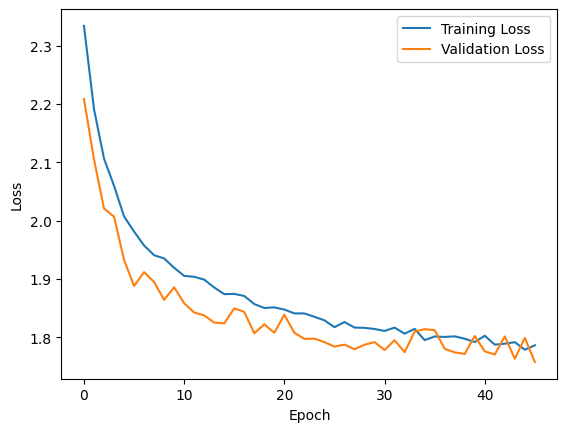

46

In [19]:
# Plot the training loss
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
len(val_losses)

### Defining an evaluate_model function to assess the trained model's performance on the validation set. It calculates and visualizes the confusion matrix, displays the F1 score for each class, and reports the overall weighted F1 score. 

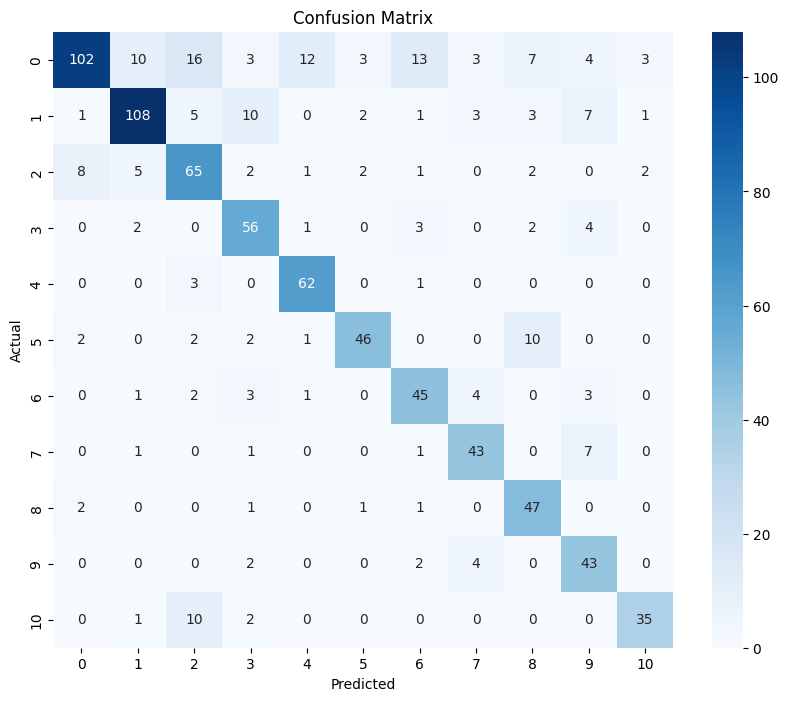

F1 score for each class:
Class 0: 0.7010
Class 1: 0.8030
Class 2: 0.6806
Class 3: 0.7467
Class 4: 0.8611
Class 5: 0.7863
Class 6: 0.7087
Class 7: 0.7818
Class 8: 0.7642
Class 9: 0.7227
Class 10: 0.7865
Overall Weighted F1 Score: 0.7529


In [20]:
from sklearn.metrics import confusion_matrix, f1_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(model, dataloader, criterion, device):
    """
    Evaluate the trained model on the validation set.

    Args:
        model (nn.Module): The trained model to be evaluated.
        dataloader (DataLoader): The validation dataloader.
        criterion (torch.nn.Module): The loss function.
        device (torch.device): The device on which to perform computations.

    Prints:
        Confusion matrix, F1 score for each class, and overall weighted F1 score.
    """
    model.eval()
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for batch in val_dataloader:
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            _, outputs = model(images)

            # Convert outputs to predicted labels
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_predictions)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(all_labels), yticklabels=np.unique(all_labels))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

    # Calculate F1 score for each class
    f1_per_class = f1_score(all_labels, all_predictions, average=None)

    print("F1 score for each class:")
    for class_idx, f1_class in enumerate(f1_per_class):
        print(f"Class {class_idx}: {f1_class:.4f}")

    # Calculate overall F1 score
    overall_f1 = f1_score(all_labels, all_predictions, average='weighted')
    print(f"Overall Weighted F1 Score: {overall_f1:.4f}")

# Assuming num_classes is defined somewhere in your code
num_classes = 10  # Change this to the actual number of classes

# Call the evaluate_model function after training
evaluate_model(fine_tuned_model, val_dataloader, criterion, device)

## Now, its time to design our style transfer algorithm using out trained model

### Defining functions for loading and preprocessing an image (load_image), displaying an image (imshow), and obtaining input images for style transfer (get_inputs).

In [30]:
# Function to load and preprocess an image
def load_image(image_path):
    """
    Loads and preprocesses an image from the given path.

    Args:
        image_path (str): Path to the image file.

    Returns:
        torch.Tensor: Preprocessed image tensor.
    """
    # Transformation pipeline including resizing, conversion to tensor, and normalization
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ])
    return transform(Image.open(image_path).convert('RGB')).unsqueeze(0)

# Function to display an image
def imshow(tensor, title=None):
    """
    Displays a given tensor as an image.

    Args:
        tensor (torch.Tensor): Image tensor to be displayed.
        title (str): Optional title for the displayed image.
    """
    # Convert tensor to PIL Image and display
    image = tensor.squeeze(0)
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

# Function to get input images for style transfer
def get_inputs(content_path, artist):
    """
    Retrieves content and style images for style transfer.

    Args:
        content_path (str): Path to the content image file.
        artist (str): Name of the artist for selecting a random style image.

    Returns:
        torch.Tensor: Preprocessed content image tensor.
        torch.Tensor: Preprocessed style image tensor.
    """
    # Load content image
    content_image = load_image(content_path)

    # Randomly select a style image from the specified artist's directory
    random_image = random.choice(os.listdir(os.path.join(root_dir, artist)))
    style_path = os.path.join(root_dir, artist, random_image)

    # Load style image
    style_image = load_image(style_path)

    # Display content and style images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Display content image
    axes[0].imshow(Image.open(content_path).convert('RGB'))
    axes[0].set_title('Content Image')
    axes[0].axis('off')

    # Display style image
    axes[1].imshow(Image.open(style_path).convert('RGB'))
    axes[1].set_title('Style Image')
    axes[1].axis('off')

    # Show the images
    plt.show()

    return content_image, style_image


**Gram Matrix**

In neural style transfer, the goal is to generate an image that combines the content of one image (the content image) with the artistic style of another image (the style image). The style of an image is characterized by the correlations between the features extracted from different channels in its convolutional neural network (CNN) layers. The Gram matrix is computed from the output of each convolutional layer, represented as a tensor with dimensions corresponding to batch size (`batch_size`), depth (`d`), and spatial dimensions (height `h` and width `w`). The procedure for calculating the Gram matrix involves:

1. Extract the depth, height, and width of the tensor using the assignment `batch_size, d, h, w = tensor.size`.
2. Reshape the tensor, flattening its spatial dimensions.
3. Compute the Gram matrix by multiplying the reshaped tensor with its transpose.

In [27]:
def gram_matrix(tensor):
    """
    Args:
        tensor (torch.Tensor): Input tensor.

    Returns:
        torch.Tensor: Gram matrix of the input tensor.
    """
    # Get the batch size, depth, height, and width of the tensor
    _, d, h, w = tensor.size()
    
    # Reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # Calculate the Gram matrix
    gram = torch.mm(tensor, tensor.t())    # Gram matrix computation
    
    return gram

### This is a style transfer algorithm
> Initialize a target image as a copy of the content image, and make it a variable for optimization.

> Normalize the images using mean and standard deviation values. Define a set of style weights for different layers in the style image.

> Calculate content loss as the mean squared difference between features of the content and target images. Calculate style loss for multiple layers by comparing the Gram matrices of features from the target and style images.

In [154]:
# Style Transfer Algorithm
def style_transfer(config):
    # Constants for image normalization
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    # Define weights for different layers in the style image
    style_weights = {'0': 1, '5': 0.75, '10': 0.2, '19': 0.2, '28': 0.2}

    # Image preprocessing
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std)
    ])

    # Load content and style images
    content = config['content']
    style = config['style']

    # Initialize a target image with the content image
    target = content.clone().requires_grad_(True)

    # Set content and style images
    content = content
    style = style

    # Initialize an Adam optimizer for updating the target image
    optimizer = torch.optim.Adam([target], lr=config['lr'])

    # Load the fine-tuned model
    fine_tuned_model.load_state_dict(torch.load('/kaggle/input/chk-11/best_custom_model.pth')['model_state_dict'])
    vgg = fine_tuned_model.eval()  # Set the model to evaluation mode

    style_losses = []
    content_losses = []

    for step in tqdm(range(config['total_step'])):
        # Extract multiple (5) convolutional feature vectors
        target_features, _ = vgg(target.to(device))
        content_features, _ = vgg(content.to(device))
        style_features, _ = vgg(style.to(device))

        # Initialize losses
        style_loss = 0
        content_loss = 0

        # Compute content loss for a specific layer
        content_loss += torch.mean((content_features[3] - target_features[3])**2)

        for f1, f2, f3 in zip(target_features, content_features, style_features):
            # Compute the style loss
            style_loss = 0

            # Iterate through each layer and compute the style loss
            for i, layer in enumerate(style_weights):
                # Get the "target" style representation for the layer
                target_feature = target_features[i]
                target_gram = gram_matrix(target_feature)
                _, d, h, w = target_feature.shape

                # Get the "style" style representation
                style_gram = gram_matrix(style_features[i])
                style_gram = style_gram

                # Compute the style loss for one layer, weighted appropriately
                layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)

                # Add to the style loss
                style_loss += layer_style_loss / (d * h * w)

        style_losses.append(style_loss.cpu())
        content_losses.append(content_loss.cpu())

        # Compute total loss, backpropagate, and optimize
        loss = config['content_weight'] * content_loss + config['style_weight'] * style_loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (step+1) % config['log_step'] == 0:
            print('Step [{}/{}], Content Loss: {:.4f}, Style Loss: {:.4f}'.format(
                step+1, config['total_step'], content_loss.item(), style_loss.item()))
        if (step+1) % config['sample_step'] == 0:
            # Save the generated image
            denorm = transforms.Normalize(mean=[-m/s for m, s in zip(mean, std)], std=[1/s for s in std])
            img = target.clone().squeeze()
            img = denorm(img).clamp_(0, 1)
            imshow(img, title='Generated Image')
#             torchvision.utils.save_image(img, 'output-{}.png'.format(step+1))
    
    return style_losses, content_losses


## Trial 0

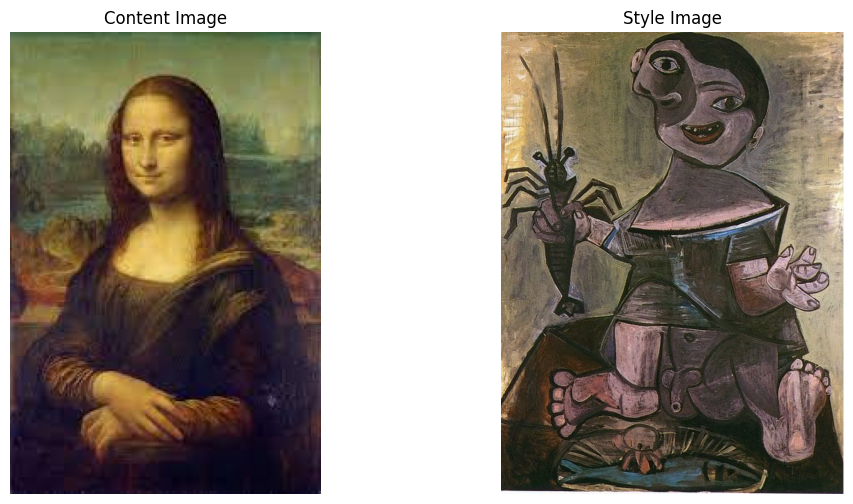

In [155]:
content_image, style_image = get_inputs(monalisa, "Pablo_Picasso")    #Content, Style Image

 25%|██▍       | 399/1600 [00:13<00:43, 27.80it/s]

Step [400/1600], Content Loss: 13.1737, Style Loss: 0.6918


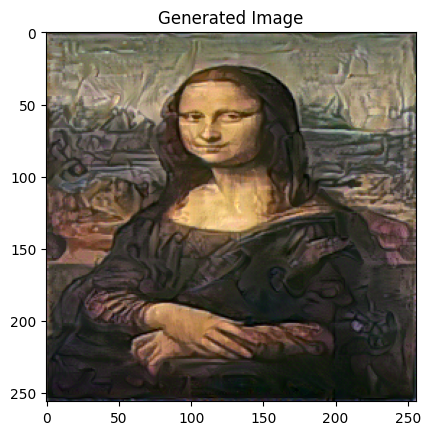

 50%|████▉     | 798/1600 [00:27<00:27, 29.66it/s]

Step [800/1600], Content Loss: 14.1455, Style Loss: 0.3191


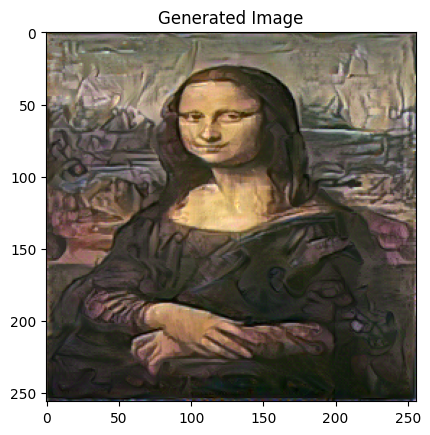

 75%|███████▍  | 1197/1600 [00:41<00:13, 29.66it/s]

Step [1200/1600], Content Loss: 14.6147, Style Loss: 0.2191


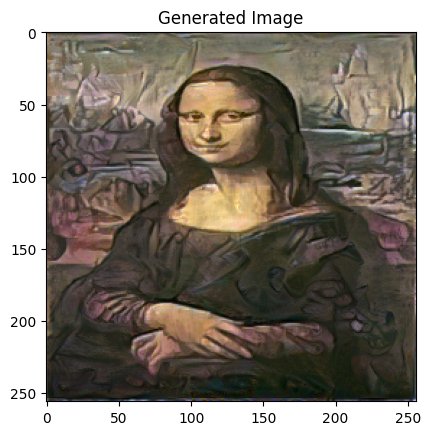

100%|█████████▉| 1599/1600 [00:55<00:00, 29.60it/s]

Step [1600/1600], Content Loss: 14.9130, Style Loss: 0.1747


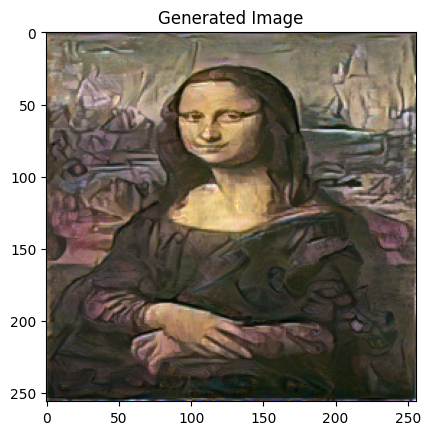

100%|██████████| 1600/1600 [00:55<00:00, 28.75it/s]


In [156]:
import torchvision
config = {
    'content': content_image,
    'style': style_image,
    'max_size': None,
    'total_step': 1600,
    'log_step': 400,
    'sample_step': 400,
    'style_weight': 1e9,
    'content_weight': 1,
    'lr': 0.005,
    
}
style_losses, content_losses = style_transfer(config)

## Trail 1

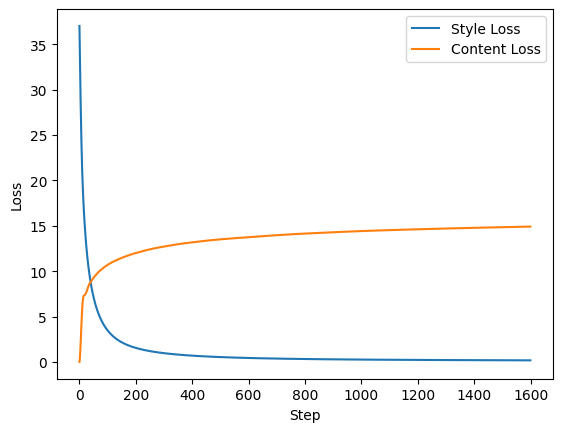

In [157]:
# Plot the style and content loss
plt.plot([style_loss.item() for style_loss in style_losses], label='Style Loss')
plt.plot([content_loss.item() for content_loss in content_losses], label='Content Loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Trial 2

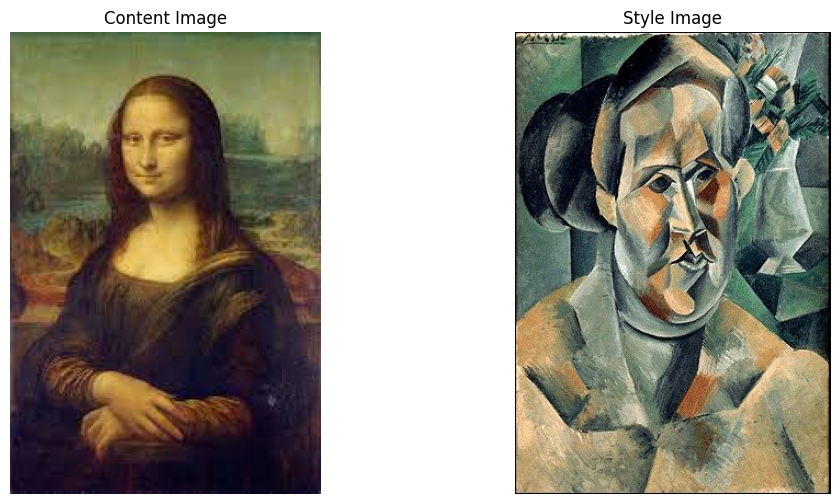

In [179]:
content_image, style_image = get_inputs(monalisa, "Pablo_Picasso")    #Content, Style Image

 20%|█▉        | 399/2000 [00:13<00:55, 29.07it/s]

Step [400/2000], Content Loss: 15.0854, Style Loss: 2.3039


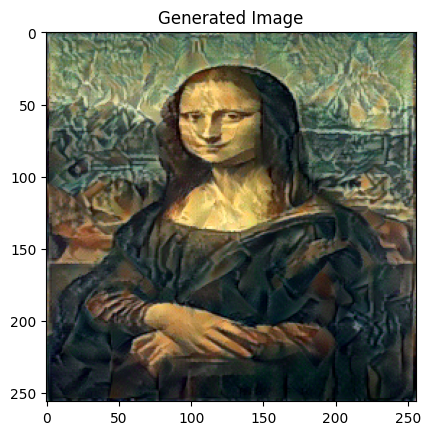

 40%|███▉      | 798/2000 [00:27<00:40, 29.61it/s]

Step [800/2000], Content Loss: 16.4037, Style Loss: 1.0386


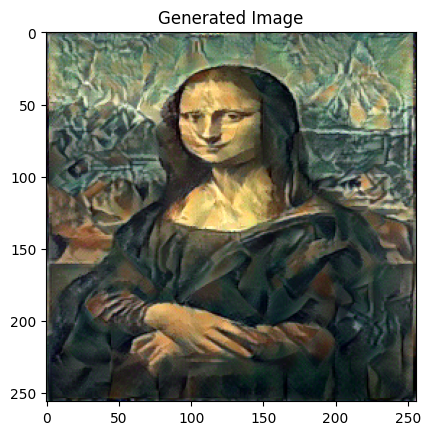

 60%|█████▉    | 1197/2000 [00:41<00:27, 29.48it/s]

Step [1200/2000], Content Loss: 17.0978, Style Loss: 0.6525


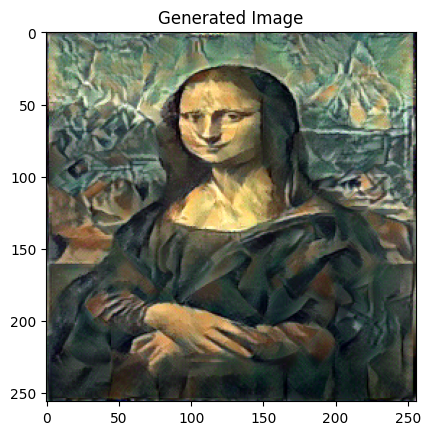

 80%|███████▉  | 1599/2000 [00:55<00:13, 29.47it/s]

Step [1600/2000], Content Loss: 17.6198, Style Loss: 0.4755


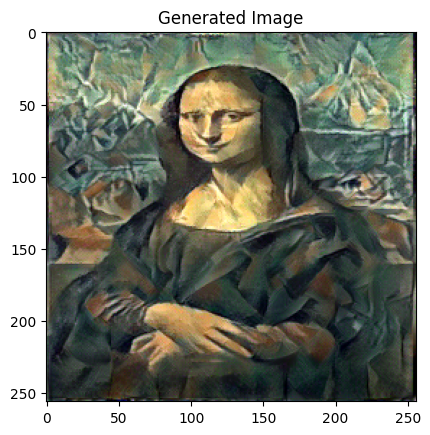

100%|█████████▉| 1998/2000 [01:09<00:00, 29.40it/s]

Step [2000/2000], Content Loss: 17.9535, Style Loss: 0.3770


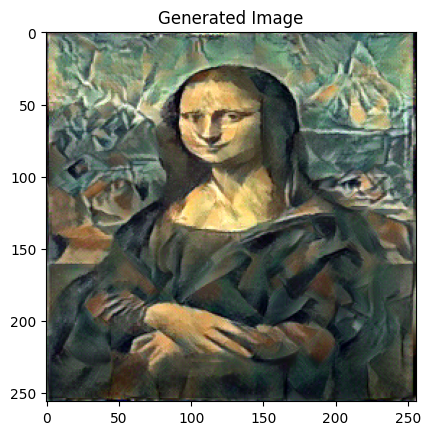

100%|██████████| 2000/2000 [01:09<00:00, 28.69it/s]


In [181]:
import torchvision
config = {
    'content': content_image,
    'style': style_image,
    'max_size': None,
    'total_step': 2000,
    'log_step': 400,
    'sample_step': 400,
    'style_weight': 1e12,
    'content_weight': 1,
    'lr': 0.005,
    
}
style_losses, content_losses = style_transfer(config)

In [ ]:
# Plot the style and content loss
plt.plot([style_loss.item() for style_loss in style_losses], label='Style Loss')
plt.plot([content_loss.item() for content_loss in content_losses], label='Content Loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Trial 3

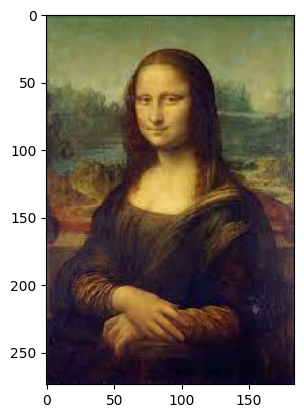

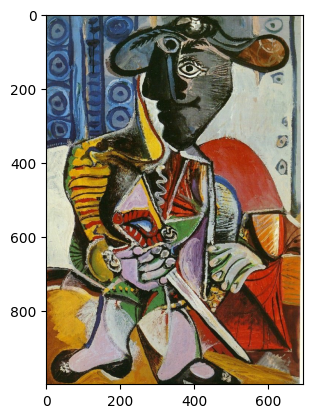

In [51]:
content_image, style_image = get_inputs(monalisa, "Pablo_Picasso")    #Content, Style Image

  2%|▏         | 105/5000 [00:03<02:47, 29.25it/s]

Step [100/5000], Content Loss: 20.8773, Style Loss: 34.7999


  4%|▍         | 204/5000 [00:07<02:44, 29.08it/s]

Step [200/5000], Content Loss: 22.5394, Style Loss: 14.9413


  6%|▌         | 303/5000 [00:10<02:41, 29.08it/s]

Step [300/5000], Content Loss: 23.5772, Style Loss: 9.0116


  8%|▊         | 399/5000 [00:13<02:36, 29.33it/s]

Step [400/5000], Content Loss: 24.3128, Style Loss: 6.4840


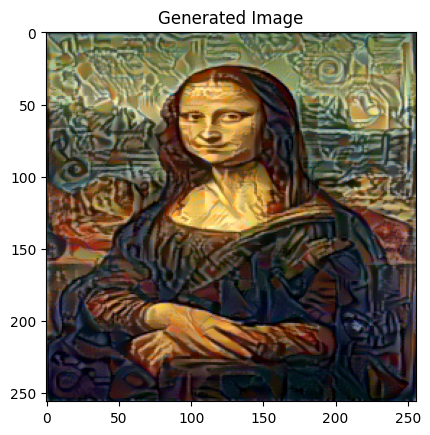

 10%|█         | 504/5000 [00:17<02:33, 29.31it/s]

Step [500/5000], Content Loss: 24.8369, Style Loss: 5.0925


 12%|█▏        | 603/5000 [00:21<02:30, 29.21it/s]

Step [600/5000], Content Loss: 25.2827, Style Loss: 4.2077


 14%|█▍        | 705/5000 [00:24<02:27, 29.18it/s]

Step [700/5000], Content Loss: 25.6652, Style Loss: 3.5895


 16%|█▌        | 798/5000 [00:27<02:23, 29.26it/s]

Step [800/5000], Content Loss: 26.0096, Style Loss: 3.1249


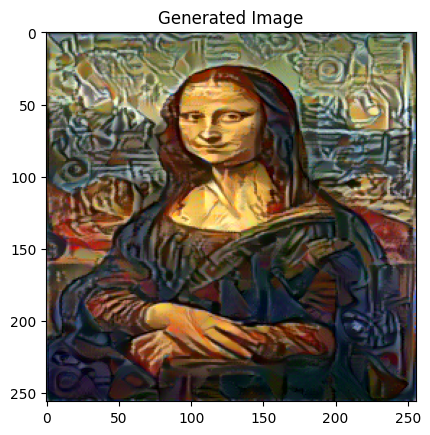

 18%|█▊        | 903/5000 [00:31<02:19, 29.27it/s]

Step [900/5000], Content Loss: 26.3049, Style Loss: 2.7597


 20%|██        | 1005/5000 [00:35<02:16, 29.27it/s]

Step [1000/5000], Content Loss: 26.5636, Style Loss: 2.4658


 22%|██▏       | 1104/5000 [00:38<02:13, 29.24it/s]

Step [1100/5000], Content Loss: 26.7858, Style Loss: 2.2241


 24%|██▍       | 1197/5000 [00:41<02:10, 29.25it/s]

Step [1200/5000], Content Loss: 26.9679, Style Loss: 2.0215


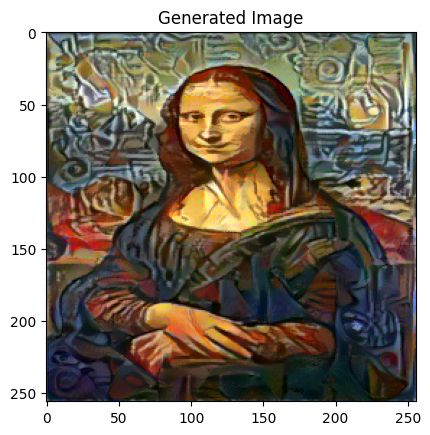

 26%|██▌       | 1305/5000 [00:45<02:06, 29.13it/s]

Step [1300/5000], Content Loss: 27.1439, Style Loss: 1.8491


 28%|██▊       | 1404/5000 [00:49<02:02, 29.32it/s]

Step [1400/5000], Content Loss: 27.3095, Style Loss: 1.7023


 30%|███       | 1503/5000 [00:52<01:58, 29.40it/s]

Step [1500/5000], Content Loss: 27.4569, Style Loss: 1.5758


 32%|███▏      | 1599/5000 [00:55<01:55, 29.37it/s]

Step [1600/5000], Content Loss: 27.5860, Style Loss: 1.4666


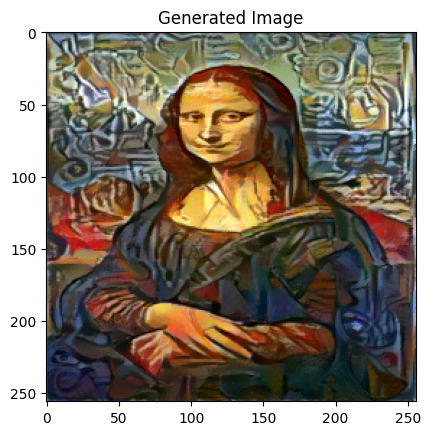

 34%|███▍      | 1704/5000 [00:59<01:52, 29.36it/s]

Step [1700/5000], Content Loss: 27.7107, Style Loss: 1.3712


 36%|███▌      | 1803/5000 [01:03<01:48, 29.60it/s]

Step [1800/5000], Content Loss: 27.8332, Style Loss: 1.2867


 38%|███▊      | 1905/5000 [01:06<01:46, 29.12it/s]

Step [1900/5000], Content Loss: 27.9350, Style Loss: 1.2120


 40%|███▉      | 1998/5000 [01:09<01:42, 29.36it/s]

Step [2000/5000], Content Loss: 28.0367, Style Loss: 1.1453


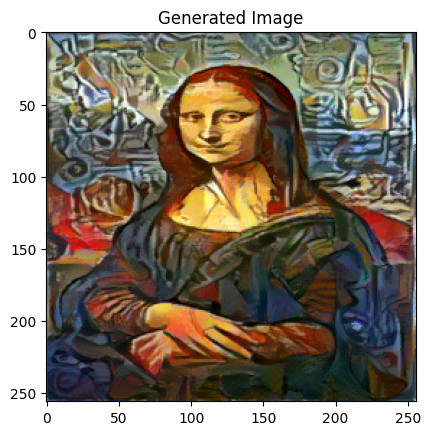

 42%|████▏     | 2103/5000 [01:13<01:38, 29.39it/s]

Step [2100/5000], Content Loss: 28.1462, Style Loss: 1.0850


 44%|████▍     | 2205/5000 [01:17<01:35, 29.34it/s]

Step [2200/5000], Content Loss: 28.2424, Style Loss: 1.0310


 46%|████▌     | 2304/5000 [01:20<01:31, 29.38it/s]

Step [2300/5000], Content Loss: 28.3282, Style Loss: 0.9824


 48%|████▊     | 2397/5000 [01:23<01:28, 29.36it/s]

Step [2400/5000], Content Loss: 28.4121, Style Loss: 0.9384


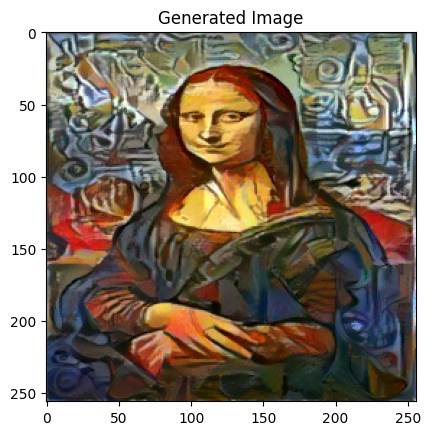

 50%|█████     | 2505/5000 [01:27<01:24, 29.42it/s]

Step [2500/5000], Content Loss: 28.4861, Style Loss: 0.8989


 52%|█████▏    | 2604/5000 [01:31<01:21, 29.27it/s]

Step [2600/5000], Content Loss: 28.5586, Style Loss: 0.8632


 54%|█████▍    | 2703/5000 [01:34<01:18, 29.43it/s]

Step [2700/5000], Content Loss: 28.6260, Style Loss: 0.8311


 56%|█████▌    | 2799/5000 [01:37<01:15, 29.24it/s]

Step [2800/5000], Content Loss: 28.6947, Style Loss: 0.8019


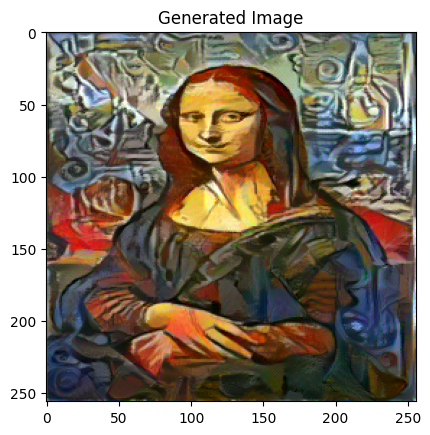

 58%|█████▊    | 2904/5000 [01:41<01:11, 29.44it/s]

Step [2900/5000], Content Loss: 28.7587, Style Loss: 0.7746


 60%|██████    | 3003/5000 [01:45<01:08, 29.34it/s]

Step [3000/5000], Content Loss: 28.8175, Style Loss: 0.7495


 62%|██████▏   | 3105/5000 [01:48<01:04, 29.34it/s]

Step [3100/5000], Content Loss: 28.8750, Style Loss: 0.7263


 64%|██████▍   | 3198/5000 [01:51<01:01, 29.47it/s]

Step [3200/5000], Content Loss: 28.9283, Style Loss: 0.7048


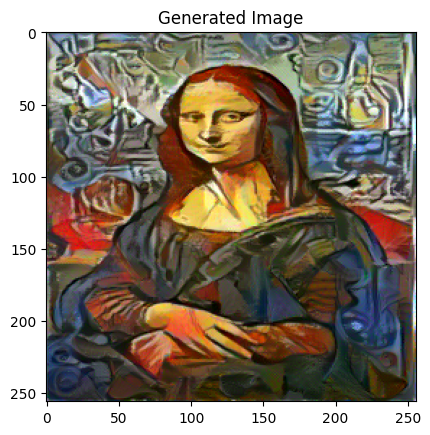

 66%|██████▌   | 3303/5000 [01:55<00:57, 29.38it/s]

Step [3300/5000], Content Loss: 28.9832, Style Loss: 0.6848


 68%|██████▊   | 3405/5000 [01:59<00:54, 29.35it/s]

Step [3400/5000], Content Loss: 29.0349, Style Loss: 0.6664


 70%|███████   | 3504/5000 [02:02<00:50, 29.69it/s]

Step [3500/5000], Content Loss: 29.0842, Style Loss: 0.6493


 72%|███████▏  | 3597/5000 [02:05<00:48, 28.90it/s]

Step [3600/5000], Content Loss: 29.1282, Style Loss: 0.6330


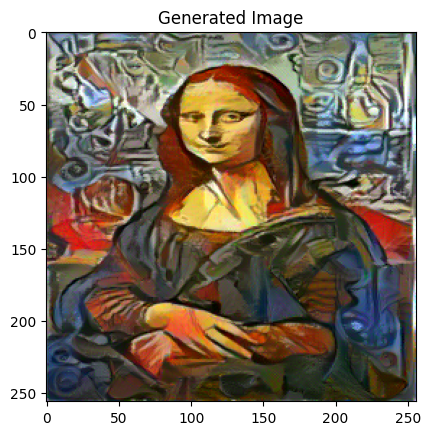

 74%|███████▍  | 3705/5000 [02:09<00:44, 29.18it/s]

Step [3700/5000], Content Loss: 29.1715, Style Loss: 0.6179


 76%|███████▌  | 3804/5000 [02:13<00:40, 29.40it/s]

Step [3800/5000], Content Loss: 29.2176, Style Loss: 0.6038


 78%|███████▊  | 3903/5000 [02:16<00:37, 28.97it/s]

Step [3900/5000], Content Loss: 29.2649, Style Loss: 0.5905


 80%|███████▉  | 3999/5000 [02:19<00:33, 29.49it/s]

Step [4000/5000], Content Loss: 29.3086, Style Loss: 0.5779


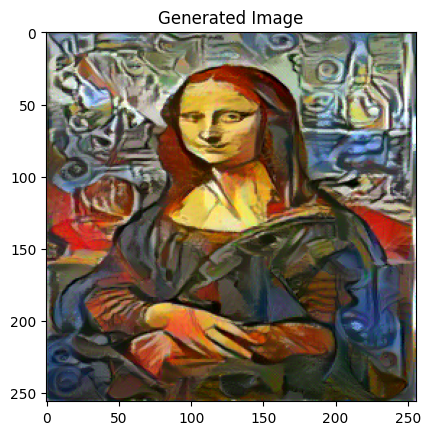

 82%|████████▏ | 4104/5000 [02:23<00:30, 29.41it/s]

Step [4100/5000], Content Loss: 29.3569, Style Loss: 0.5659


 84%|████████▍ | 4203/5000 [02:27<00:27, 29.44it/s]

Step [4200/5000], Content Loss: 29.4056, Style Loss: 0.5544


 86%|████████▌ | 4305/5000 [02:30<00:23, 29.40it/s]

Step [4300/5000], Content Loss: 29.4478, Style Loss: 0.5436


 88%|████████▊ | 4398/5000 [02:33<00:20, 29.48it/s]

Step [4400/5000], Content Loss: 29.4966, Style Loss: 0.5332


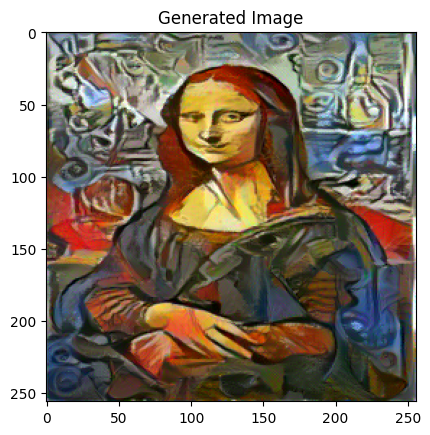

 90%|█████████ | 4503/5000 [02:37<00:16, 29.32it/s]

Step [4500/5000], Content Loss: 29.5423, Style Loss: 0.5233


 92%|█████████▏| 4605/5000 [02:41<00:13, 29.34it/s]

Step [4600/5000], Content Loss: 29.5825, Style Loss: 0.5140


 94%|█████████▍| 4704/5000 [02:44<00:10, 29.43it/s]

Step [4700/5000], Content Loss: 29.6194, Style Loss: 0.5050


 96%|█████████▌| 4797/5000 [02:47<00:06, 29.34it/s]

Step [4800/5000], Content Loss: 29.6590, Style Loss: 0.4962


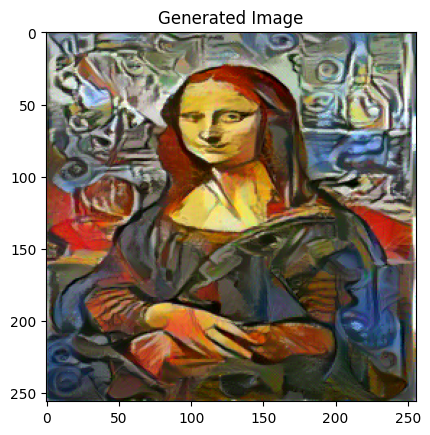

 98%|█████████▊| 4905/5000 [02:51<00:03, 29.21it/s]

Step [4900/5000], Content Loss: 29.6971, Style Loss: 0.4878


100%|██████████| 5000/5000 [02:54<00:00, 28.59it/s]


Step [5000/5000], Content Loss: 29.7342, Style Loss: 0.4800


In [54]:
import torchvision
config = {
    'content': content_image,
    'style': style_image,
    'max_size': None,
    'total_step': 5000,
    'log_step': 100,
    'sample_step': 400,
    'style_weight': 1e12,
    'content_weight': 1,
    'lr': 0.005,
    
}
style_losses, content_losses = style_transfer(config)

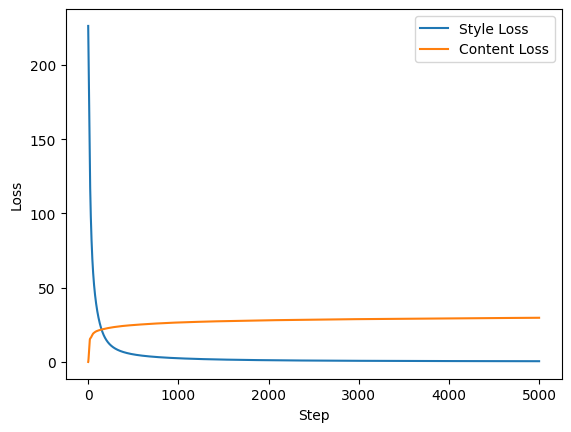

In [55]:
# Plot the style and content loss
plt.plot([style_loss.item() for style_loss in style_losses], label='Style Loss')
plt.plot([content_loss.item() for content_loss in content_losses], label='Content Loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Other Approaches

> Instaed of initializing random image pixels that leads to the increase in number of steps while training, Encoder decoder model can be taken into consideration where your genearted image will be sampled from the latent space of style and content image rather than initializing it randonly.

> Integrating Generative Adversarial Networks (GANs) enhances the style transfer algorithm by introducing adversarial training. This involves a generator network creating stylized images and a discriminator discerning real from generated ones.

> Leveraging diffusion models in style transfer can integrate techniques from generative models that learn complex data distributions. Incorporating diffusion models introduces a probabilistic approach to style transfer, allowing for fine-grained control over stylized output and the potential to handle a broader range of artistic variations. By training the model on a diverse dataset of artistic styles, the diffusion process learns to generate images that match the desired style.

## Limitations of this model:

1. **High Quality Images:**
   - Generating high-quality images may require significant computational resources and time. Also, we can only generate 224*224 images for this model

2. **Loss of Content Information:**
   - This might lead to a loss of content information in the generated images. Striking a balance between preserving content and applying style is a challenging aspect.

3. **Overfitting to Style Images:**
   - It might overfit to the specific style images used during training. They may struggle to generalize well to new styles, especially those significantly different from the training set.

4. **Hyperparameter Sensitivity:**
   - The performance of style transfer algorithms is sensitive to hyperparameters, and finding the right set of parameters for a diverse range of content and style pairs can be challenging.
   
5. **Time Taking:**
   - This is not the real time inference model.

## Potential Improvements in this model:

1. **Content Preservation:**
   - Improving methods to better preserve content information in generated images is crucial. This could involve refining loss functions or incorporating additional constraints.

2. **Generalization to Unseen Styles:**
   - Developing models that generalize well to unseen styles is essential. This could involve more diverse training datasets, data augmentation techniques, or domain adaptation methods.

4. **Real-Time Applications:**
   - Enhancing the speed of style transfer algorithms to enable real-time applications, such as video stylization, is an area for improvement. This could involve optimizing model architectures or leveraging hardware acceleration.

